# Gymnasium Basics: Acrobot-v1
This notebook is a step-by-step introduction to [Gymnasium](https://gymnasium.farama.org/), the standard toolkit for reinforcement learning (RL) environments in Python.

We'll use **Acrobot-v1**, a classic control environment: a two-link robotic arm hanging from a fixed point. The agent applies torque to the joint *between* the two links, and the goal is to swing the free end up above a target height.

**Why Acrobot for a first notebook?**
- The *actions* are simple: there are only 3 of them (push left, do nothing, push right).
- The *observations* (what the agent can see) are continuous numbers, which means we'll learn a very important RL skill: **discretization** — turning continuous numbers into a finite table of "buckets" so we can build a Q-table out of them.

**What we'll cover:**
1. Installing and importing Gymnasium
2. Creating an environment and understanding `reset()` / `step()`
3. Random actions (just to see the environment move)
4. Understanding the observation and action spaces
5. Watching a random episode as a video clip
6. Discretizing continuous observations into bins
7. A Q-learning agent that learns from the discretized state
8. Plotting learning progress
9. Watching the trained agent as a video clip
10. Comparing the random and trained agent side by side

Along the way, we'll pause on a few core **Python** concepts that show up in almost every Gymnasium notebook, in case they're new to you.


## 1. Installation
Gymnasium isn't part of the Python standard library, so it needs to be installed once per environment (computer / virtual environment / notebook server). If you've already installed it, you can skip this cell — running `pip install` again is harmless, it'll just confirm it's already there.


In [ ]:
# Run this once. The "classic-control" extra includes Acrobot, CartPole, Pendulum, and Mountain Car.
# The leading ! tells Jupyter to run this as a shell/terminal command instead of Python code.
!pip install "gymnasium[classic-control]" --quiet


## 2. Imports
Same idea as any Python script: we import the libraries we need before using them.

- `gymnasium` — the RL environment toolkit itself
- `numpy` — for arrays and numerical operations (Gymnasium observations come back as NumPy arrays)
- `matplotlib.pyplot` — for plotting our agent's learning progress, and for building our video clips


In [ ]:
import numpy as np
import gymnasium as gym
import matplotlib.pyplot as plt

# For reproducibility — using the same seed means "random" choices are
# actually the same every time you re-run the notebook, which makes
# debugging and comparing results much easier.
SEED = 0
np.random.seed(SEED)


## 3. A quick Python analogy before we dive in

If you've written a simple text-based game in Python before, you've probably written something like a number-guessing game:

```python
secret = 7
guess = int(input("Guess a number: "))   # get input from the "world" (the player)
if guess == secret:
    print("You got it!")                 # the world gives feedback
else:
    print("Try again.")
```

The pattern is: **ask for input → get a result → react to it → repeat.**

Gymnasium environments work the same way, except instead of a human typing a guess, *our code* picks an action, and instead of `input()`, we call `env.step(action)`. The environment "world" then hands back what happened. We'll see exactly what it hands back in a moment — but keep this loop in your head:

> **choose an action → send it to the environment → receive the result → repeat**

This loop is the heartbeat of every single Gymnasium notebook you'll ever write.


## 4. Creating the Environment
We create environments with `gym.make(environment_id)`. The id is just a string Gymnasium looks up in its registry — `"Acrobot-v1"` here. (The `-v1` is a version number; environments occasionally get updated, and the version number tells you exactly which rules apply.)


In [ ]:
env = gym.make("Acrobot-v1")
env


`env` is now an object representing the Acrobot world. We haven't started an episode yet — for that, we need `reset()`.

### Python refresher: tuple unpacking
`env.reset()` returns **two things at once**: the starting observation, and an `info` dictionary (usually empty, used for debugging/extra info). In Python, when a function returns multiple values, you can "unpack" them directly into separate variables in one line:

```python
observation, info = env.reset()
```

This is the exact same trick as:
```python
x, y = 3, 4
```
Python just matches up the items on the right with the names on the left, in order.


In [ ]:
observation, info = env.reset(seed=SEED)

print("Observation:", observation)
print("Info:", info)


## 5. Understanding the Observation
The printed array has **6 numbers**. Acrobot's documentation tells us what they mean:

| Index | Meaning |
|---|---|
| 0 | cos(theta1) — cosine of the first joint's angle |
| 1 | sin(theta1) — sine of the first joint's angle |
| 2 | cos(theta2) — cosine of the second joint's angle |
| 3 | sin(theta2) — sine of the second joint's angle |
| 4 | angular velocity of joint 1 |
| 5 | angular velocity of joint 2 |

Why sine and cosine instead of just the angle in radians? Because angles "wrap around" (359° is right next to 0°), which can confuse a learning algorithm. Sine and cosine together describe an angle without any wraparound discontinuity — this is a common trick in robotics and RL.

Notice that the observation is **6 continuous numbers** — not a single tidy integer. There are infinitely many possible combinations of 6 real numbers, which matters a lot once we get to building a Q-table in Section 7.

For now, let's confirm this programmatically using the environment's `observation_space`:


In [ ]:
print("Observation space:", env.observation_space)
print("Shape:", env.observation_space.shape)
print("Lower bounds:", env.observation_space.low)
print("Upper bounds:", env.observation_space.high)


## 6. Understanding the Action Space
Acrobot has a small, **discrete** action space — only 3 possible actions:

| Action | Meaning |
|---|---|
| 0 | apply -1 torque (push one way) |
| 1 | apply 0 torque (do nothing) |
| 2 | apply +1 torque (push the other way) |


In [ ]:
print("Action space:", env.action_space)
print("Number of actions:", env.action_space.n)

# .sample() picks a uniformly random valid action — handy for testing
print("A random action:", env.action_space.sample())


## 7. Taking a Step
Now let's actually move the arm. `env.step(action)` is Gymnasium's version of `input()` from our guessing-game analogy — it's the moment we hand control to the environment and get a result back.

It returns **five** things this time:

```python
observation, reward, terminated, truncated, info = env.step(action)
```

| Return value | Meaning |
|---|---|
| `observation` | the new state, after the action |
| `reward` | the reward for this step (Acrobot gives `-1` every step until success, then `0`) |
| `terminated` | `True` if the episode ended because the agent *succeeded* (or in other envs, failed) |
| `truncated` | `True` if the episode ended just because we hit a time limit (500 steps for Acrobot), regardless of success |
| `info` | a dictionary for extra debugging info, often empty |

### Python refresher: `or` with booleans
`terminated` and `truncated` are both `True`/`False` values (booleans). We almost always want to know "did the episode end for *any* reason?" — that's exactly what the `or` operator is for:

```python
done = terminated or truncated   # True if either one is True
```


In [ ]:
observation, info = env.reset(seed=SEED)

action = env.action_space.sample()  # pick a random action
observation, reward, terminated, truncated, info = env.step(action)

print("Action taken:", action)
print("New observation:", observation)
print("Reward:", reward)
print("Terminated:", terminated)
print("Truncated:", truncated)


## 8. Running a Full Episode (Random Actions)
Let's put the loop together and run one entire episode, taking random actions the whole time, just to see how the environment behaves before any learning happens.

### Python refresher: `while` loop with a `break`
We don't know in advance exactly how many steps an episode will take, so a `for` loop with a fixed range isn't quite right here. Instead we use a `while True:` loop — "keep going forever" — combined with `break` to escape the loop the moment we're `done`. This pattern is common any time you're repeating something "until a condition becomes true," rather than a fixed number of times.


In [ ]:
observation, info = env.reset(seed=SEED)
total_reward = 0
steps = 0

while True:
    action = env.action_space.sample()                     # random action
    observation, reward, terminated, truncated, info = env.step(action)

    total_reward += reward
    steps += 1

    done = terminated or truncated
    if done:
        break

print(f"Episode finished after {steps} steps.")
print(f"Total reward: {total_reward}")
print(f"Succeeded (terminated early)? {terminated}")


Since Acrobot gives `-1` every step, the total reward is just the negative of the number of steps taken. A random policy almost never manages to swing the arm up high enough — so you'll typically see `steps = 500` (the truncation limit) and a total reward around `-500`. That's our baseline to beat.

Numbers like this are useful, but seeing the arm flail around is a lot more intuitive. Let's make a quick video clip of it.


## 9. Watching the Random Agent
To actually *see* the environment, we need to render it as images. There are a few ways Gymnasium can show us what's happening, set by the `render_mode` argument when we create the environment:

- `render_mode="human"` — pops open a live window (great locally, doesn't work in most notebook setups)
- `render_mode="rgb_array"` — hands back each frame as a plain NumPy array of pixel colors, which **we** can display however we like

We'll use `"rgb_array"` and collect the frames into a Python list as the episode runs. Each frame is just an image (a grid of numbers), so a list of frames is really a list of images — a short flipbook.

### Python refresher: building a list as you go
```python
frames = []          # start empty
frames.append(x)     # add one item at a time, inside a loop
```
This is one of the most common patterns in Python: start with an empty list, then `.append()` to it each time through a loop.

### Animating a flipbook with matplotlib
Once we have a list of frames, `matplotlib.animation.FuncAnimation` can step through them and `HTML(anim.to_jshtml())` renders the result as an interactive video player, right inside the notebook — play, pause, and scrub through frames, no external files involved.


In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML

def collect_random_episode_frames(seed=SEED, max_steps=500):
    """Run one episode with random actions and return the list of rendered frames."""
    render_env = gym.make("Acrobot-v1", render_mode="rgb_array")
    obs, info = render_env.reset(seed=seed)

    frames = [render_env.render()]
    for _ in range(max_steps):
        action = render_env.action_space.sample()
        obs, reward, terminated, truncated, info = render_env.step(action)
        frames.append(render_env.render())
        if terminated or truncated:
            break

    render_env.close()
    return frames

def make_animation(frames, title=""):
    """Turn a list of image frames into an inline, playable animation."""
    fig, ax = plt.subplots()
    ax.axis("off")
    if title:
        ax.set_title(title)
    img = ax.imshow(frames[0])

    def update(i):
        img.set_data(frames[i])
        return [img]

    anim = animation.FuncAnimation(
        fig, update, frames=len(frames), interval=40, blit=True
    )
    plt.close(fig)  # prevents a duplicate static image from also being displayed
    return anim

random_frames = collect_random_episode_frames()
print(f"Collected {len(random_frames)} frames from the random-action episode.")

random_anim = make_animation(random_frames, title="Random actions")
HTML(random_anim.to_jshtml())


Take a look — the arm just twitches around without any real strategy. That's expected: nothing has been learned yet. This clip is our visual baseline, the same way `-500` was our numeric baseline.


## 10. From Continuous to Discrete: Building a Q-Table for Acrobot
A Q-table needs a finite set of rows — one per possible state. That's no problem when a state is already a single integer, but Acrobot's state is **6 continuous numbers**, and there are infinitely many possible combinations of those.

The fix is to **discretize** the state: chop each of the 6 dimensions into a fixed number of "bins," then describe any observation as *which bin it falls into* on each dimension. This turns the infinite continuous space into a finite grid of discrete states that a Q-table can actually have rows for.

### Python refresher: `np.linspace` and `np.digitize`
- `np.linspace(low, high, n)` creates `n` evenly spaced numbers between `low` and `high` — we'll use this to define the edges of our bins.
- `np.digitize(value, bin_edges)` tells you which bin a value falls into, given a list of bin edges.

```python
edges = np.linspace(-1, 1, 5)        # 4 bins between -1 and 1
np.digitize(0.3, edges)              # tells you which of the 4 bins 0.3 falls into
```

We'll discretize each of the 6 observation dimensions into a small number of bins. More bins = more precision but a much bigger (slower to learn) table; fewer bins = faster learning but coarser detail. This trade-off is a recurring theme in RL.


In [10]:
# Number of bins per dimension. Keep this modest -- the table size grows
# multiplicatively! With 6 dimensions, 6 bins each gives 6**6 ~ 46,656 states.
N_BINS = 6

obs_low = env.observation_space.low
obs_high = env.observation_space.high

# Angular velocities are technically unbounded by physics but Gymnasium
# documents a practical range (+-4*pi and +-9*pi); we use those bounds directly.
print("Low: ", obs_low)
print("High:", obs_high)

# Build one set of bin edges per dimension.
# We use N_BINS - 1 edges, which creates N_BINS bins (think: 3 fence posts make 2 fields,
# but here we use a fencepost convention that yields exactly N_BINS bins -- see check below).
bin_edges = [
    np.linspace(obs_low[i], obs_high[i], N_BINS - 1)
    for i in range(len(obs_low))
]

def discretize(observation):
    """Convert a continuous 6-value observation into a tuple of 6 bin indices."""
    return tuple(
        int(np.digitize(observation[i], bin_edges[i]))
        for i in range(len(observation))
    )

# Quick sanity check
obs, info = env.reset(seed=SEED)
print("Raw observation:  ", obs)
print("Discretized state:", discretize(obs))


Low:  [ -1.        -1.        -1.        -1.       -12.566371 -28.274334]
High: [ 1.        1.        1.        1.       12.566371 28.274334]
Raw observation:   [ 0.99962485  0.02738891  0.9989402  -0.04602639 -0.09180529 -0.09669447]
Discretized state: (4, 3, 4, 2, 2, 2)


### Python refresher: dictionaries as a sparse table
A Q-table is conceptually a 2D array: `Q[state, action]`. That works fine when the number of possible states is small.

Here we have up to `6**6 = 46656` possible discretized states, most of which the agent may never actually visit. Instead of allocating a giant array upfront, we'll use a Python **dictionary** that creates a row of Q-values for a state only the first time we encounter it. This is a very common pattern once state spaces get large: store knowledge for *what's actually been seen*, not for *everything that could possibly happen*.

```python
Q = {}                         # empty dictionary: no states known yet
state = (2, 1, 4, 0, 3, 5)      # a tuple can be used as a dictionary key (a list cannot!)
if state not in Q:
    Q[state] = np.zeros(env.action_space.n)   # 3 zeros, one per action
```

We'll wrap this "look it up, or create it if missing" pattern into a small helper function.


In [11]:
Q = {}  # maps discretized_state -> array of Q-values, one per action

def get_q_values(state):
    """Return the Q-values for a state, creating a fresh all-zero row if we haven't seen it before."""
    if state not in Q:
        Q[state] = np.zeros(env.action_space.n)
    return Q[state]


## 11. Epsilon-Greedy Action Selection
With probability `epsilon`, pick a random action to **explore**; otherwise pick the best known action to **exploit** what we've learned so far.

### Python refresher: `np.argmax`
`np.argmax(array)` returns the *index* of the largest value in an array — exactly what we need to find "the action with the highest Q-value."


In [12]:
def epsilon_greedy_action(state, epsilon):
    if np.random.rand() < epsilon:
        return env.action_space.sample()              # explore
    else:
        return int(np.argmax(get_q_values(state)))     # exploit


## 12. Hyperparameters
Four knobs control how training behaves:
- **alpha** — learning rate: how much each new experience updates our existing estimate
- **gamma** — discount factor: how much we value future rewards vs. immediate ones
- **epsilon** — exploration rate, starting high and decaying over time
- **episodes** — how many practice rounds to run

Acrobot is a genuinely hard environment (continuous state, sparse success signal, and a 500-step penalty for not succeeding), so it needs many episodes to show any improvement. We've picked values that work reasonably well for a teaching notebook, but feel free to experiment — tweaking these and watching what happens is one of the best ways to build intuition for RL.


In [13]:
alpha = 0.1          # learning rate
gamma = 0.99         # discount factor

epsilon = 1.0        # start by exploring 100% of the time
epsilon_min = 0.05   # never fully stop exploring
epsilon_decay = 0.9995  # multiply epsilon by this after every episode

episodes = 5000
max_steps_per_episode = 500   # matches Acrobot's own truncation limit

# Tracking, for plotting later
episode_rewards = []


## 13. The Training Loop
Each episode, the agent:
1. Resets the environment and discretizes the starting observation.
2. Repeatedly picks an action (epsilon-greedy), takes a step, and discretizes the new observation.
3. Updates the Q-table using the **Q-learning update rule**.
4. Stops when the episode ends (`terminated` or `truncated`).

The Q-learning update rule:

```
Q[state, action] += alpha * (reward + gamma * max(Q[next_state]) - Q[state, action])
```

In words: *nudge our estimate for this state-action pair towards "the reward I just got, plus a discounted estimate of how good things look from here," and do so by a small amount (`alpha`) rather than all at once.*


In [14]:
for ep in range(episodes):
    obs, info = env.reset()
    state = discretize(obs)
    total_reward = 0

    for t in range(max_steps_per_episode):
        action = epsilon_greedy_action(state, epsilon)

        next_obs, reward, terminated, truncated, info = env.step(action)
        next_state = discretize(next_obs)
        done = terminated or truncated

        # Q-learning update
        best_next_value = np.max(get_q_values(next_state))
        td_target = reward + gamma * best_next_value
        td_error = td_target - get_q_values(state)[action]
        Q[state][action] += alpha * td_error

        state = next_state
        total_reward += reward

        if done:
            break

    episode_rewards.append(total_reward)

    # Decay epsilon, but never below epsilon_min
    epsilon = max(epsilon_min, epsilon * epsilon_decay)

    if (ep + 1) % 500 == 0:
        recent_avg = np.mean(episode_rewards[-500:])
        print(f"Episode {ep + 1}/{episodes} | epsilon={epsilon:.3f} | avg reward (last 500): {recent_avg:.1f}")


Episode 500/5000 | epsilon=0.779 | avg reward (last 500): -498.1
Episode 1000/5000 | epsilon=0.606 | avg reward (last 500): -492.7
Episode 1500/5000 | epsilon=0.472 | avg reward (last 500): -473.4
Episode 2000/5000 | epsilon=0.368 | avg reward (last 500): -449.0
Episode 2500/5000 | epsilon=0.286 | avg reward (last 500): -424.9
Episode 3000/5000 | epsilon=0.223 | avg reward (last 500): -415.8
Episode 3500/5000 | epsilon=0.174 | avg reward (last 500): -386.7
Episode 4000/5000 | epsilon=0.135 | avg reward (last 500): -357.8
Episode 4500/5000 | epsilon=0.105 | avg reward (last 500): -375.5
Episode 5000/5000 | epsilon=0.082 | avg reward (last 500): -371.5


## 14. Plotting the Learning Curve
We'll plot a **moving average** of the reward per episode. Looking at raw per-episode rewards is noisy (lots of randomness episode to episode); smoothing it out makes the overall trend visible.

### Python refresher: list comprehensions, briefly
You'll sometimes see RL code build up lists like this:

```python
squares = [x**2 for x in range(10)]
```

This is a **list comprehension** — a compact way to write a `for` loop that builds a list. We're not using one in the plotting code below, but you'll see plenty of them in Gymnasium tutorials elsewhere, so it's worth recognizing the pattern: `[expression for item in iterable]`.


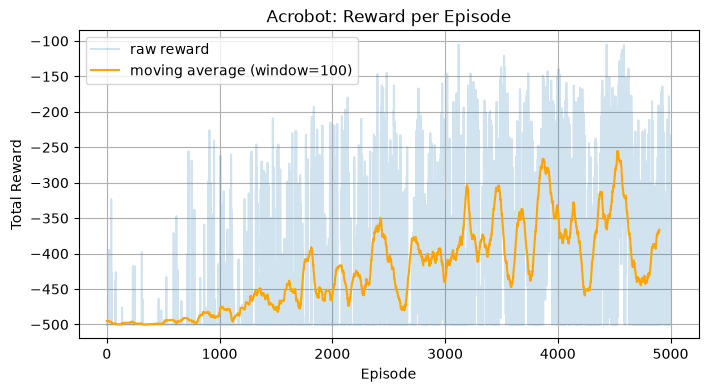

In [15]:
def moving_average(x, window=100):
    x = np.array(x, dtype=float)
    if len(x) < window:
        return x
    cumsum = np.cumsum(np.insert(x, 0, 0))
    return (cumsum[window:] - cumsum[:-window]) / float(window)

smoothed = moving_average(episode_rewards, window=100)

plt.figure(figsize=(8, 4))
plt.plot(episode_rewards, alpha=0.2, label="raw reward")
plt.plot(smoothed, color="orange", label="moving average (window=100)")
plt.title("Acrobot: Reward per Episode")
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.grid(True)
plt.legend()
plt.show()


**What should you expect to see?** Acrobot is a genuinely difficult environment for a simple discretized Q-table — it's one of the environments Gymnasium doesn't even define an official "solved" reward threshold for, *because tabular methods don't reliably solve it well*. With this approach you should see the average reward improve somewhat (climbing up from around -500 towards maybe -300 to -400) over several thousand episodes, but don't expect a perfectly smooth curve.

This is actually an important, honest lesson in RL: **the algorithm and state representation matter enormously**, and tabular Q-learning with hand-picked bins is a relatively weak tool for continuous-control problems like this. Later, you'd typically reach for **function approximation** (e.g. a neural network, as in Deep Q-Learning / DQN) instead of a lookup table — but that's a topic for a future notebook, once these fundamentals feel solid.


## 15. Evaluating the Learned Policy
We evaluate by running the **greedy** policy (always picking the best known action, no more exploring) and seeing how it performs on fresh episodes.


In [16]:
def evaluate_policy(env, Q, episodes=20, max_steps=500):
    rewards = []
    successes = 0
    for _ in range(episodes):
        obs, info = env.reset()
        state = discretize(obs)
        total_reward = 0
        for _ in range(max_steps):
            action = int(np.argmax(get_q_values(state)))
            obs, reward, terminated, truncated, info = env.step(action)
            state = discretize(obs)
            total_reward += reward
            if terminated or truncated:
                if terminated:
                    successes += 1
                break
        rewards.append(total_reward)
    return np.mean(rewards), successes / episodes

eval_env = gym.make("Acrobot-v1")
avg_reward, success_rate = evaluate_policy(eval_env, Q)
print(f"Average reward over evaluation episodes: {avg_reward:.1f}")
print(f"Success rate (reached the target height before timing out): {success_rate * 100:.0f}%")


Average reward over evaluation episodes: -318.8
Success rate (reached the target height before timing out): 95%


## 16. Watching the Trained Agent
Now let's make the same kind of clip as before, but using the **greedy** policy instead of random actions. We can reuse our `make_animation()` helper from Section 9 — only the action-selection logic changes.


In [17]:
def collect_trained_episode_frames(Q, seed=SEED, max_steps=500):
    """Run one episode using the greedy (trained) policy and return the rendered frames."""
    render_env = gym.make("Acrobot-v1", render_mode="rgb_array")
    obs, info = render_env.reset(seed=seed)
    state = discretize(obs)

    frames = [render_env.render()]
    for _ in range(max_steps):
        action = int(np.argmax(get_q_values(state)))
        obs, reward, terminated, truncated, info = render_env.step(action)
        state = discretize(obs)
        frames.append(render_env.render())
        if terminated or truncated:
            break

    render_env.close()
    return frames

trained_frames = collect_trained_episode_frames(Q)
print(f"Collected {len(trained_frames)} frames from the trained-agent episode.")

trained_anim = make_animation(trained_frames, title="Trained agent (greedy policy)")
HTML(trained_anim.to_jshtml())


Collected 498 frames from the trained-agent episode.


Compare this to the random clip from Section 9. Depending on how training went, you should see the arm move with much more purpose — even if it doesn't perfectly nail the target every time, the motion should look noticeably less chaotic than the random baseline.


## 17. Comparing Random vs. Trained, Side by Side
Numbers and separate clips are useful, but putting the random and trained episodes **side by side** makes the improvement easiest to see at a glance. We'll reuse the `random_frames` and `trained_frames` lists we already collected, and animate two image panels in the same figure.

### Python refresher: `zip()` and unequal-length lists
The two episodes likely ran for different numbers of steps (the trained agent may finish early if it succeeds!). When animating two lists of different lengths side by side, we just play each clip up to its own length and freeze on the last frame once it's done — a simple `min`/`max` and an index check handles this.


In [18]:
def make_comparison_animation(frames_a, frames_b, label_a="Random", label_b="Trained"):
    """Animate two episodes side by side, each looping until it reaches its own final frame."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4.5))
    for ax in (ax1, ax2):
        ax.axis("off")
    ax1.set_title(label_a)
    ax2.set_title(label_b)

    img1 = ax1.imshow(frames_a[0])
    img2 = ax2.imshow(frames_b[0])

    n_frames = max(len(frames_a), len(frames_b))

    def update(i):
        # Once a clip runs out of frames, just hold on its final frame.
        idx_a = min(i, len(frames_a) - 1)
        idx_b = min(i, len(frames_b) - 1)
        img1.set_data(frames_a[idx_a])
        img2.set_data(frames_b[idx_b])
        return [img1, img2]

    anim = animation.FuncAnimation(
        fig, update, frames=n_frames, interval=40, blit=True
    )
    plt.close(fig)
    return anim

comparison_anim = make_comparison_animation(
    random_frames, trained_frames, label_a="Random actions", label_b="Trained agent"
)
HTML(comparison_anim.to_jshtml())


This is the clearest way to *see* what all that training accomplished: same environment, same physics, two very different strategies for choosing actions.


## Wrap-up & Next Steps

**What we covered:**
- The `reset()` / `step()` loop that underlies every Gymnasium environment
- Reading `observation_space` and `action_space` to understand what an environment expects
- Rendering and animating episodes directly inline, with no external files
- Discretizing a continuous observation space so tabular Q-learning can be applied
- Storing a Q-table sparsely with a dictionary, instead of a dense array
- Training, plotting, evaluating, and visually comparing a learned policy against a random baseline

**A few honest notes:**
- Acrobot is *hard* for tabular methods — if your trained agent doesn't reliably swing all the way up, that's expected, not a bug in your code.
- The number of bins (`N_BINS`) is a real lever — try increasing or decreasing it and watch how training speed and final performance change.
- Try also adjusting `alpha`, `gamma`, `epsilon_decay`, and `episodes` to build intuition for what each one actually does.

**Where to go from here:**
- Try **CartPole-v1**: also discrete actions, continuous (4-dimensional) observations, but generally easier to solve well with this same discretization approach — good for confirming your code works before tackling harder problems.
- Try **Pendulum-v1**: a *continuous* action space (you don't just pick from 3 actions — you pick any real-numbered torque). This requires different algorithms (Q-tables don't directly apply), and is a natural next challenge once you're comfortable with the basics here.
- Look into **Deep Q-Networks (DQN)**, which replace the Q-table with a neural network — useful for environments where discretization throws away too much information. Libraries like **Stable-Baselines3** provide ready-made, well-tuned implementations of DQN and other algorithms once you're ready to move beyond hand-written agents.
